# 🎆 Amazon Nova Omni - Image Editing Capabilities

Image editing is accomplished by passing a single image and a set of text instructions to the model. This example uses the Converse API. Image editing should allow you to do all of the following (and possibly more):

* Add elements
* Remove elements
* Replace elements
* Change elements (e.g. “change his shirt to red”)
* Change the background
* Extract or isolate an item in an image
* Modify action/pose without changing the subject's identity (e.g. “Make this person smile”, “Make the man look to the left”)
* Change the position of an item (e.g. "Move the apple to the left half of the image")
* Change an image’s style
* Change the lighting in an image


## 🎯 What You'll Build

This hands-on section will guide you through how to use Nova Omni image editing capabilities with real-estate listing examples

By the end of this workshop, you'll have:
- ✅ An understanding of how to edit images using Nova Omni
- ✅ Examples to get you started

## Workshop Outline

1. Object Addition to image - Virtual staging of a home
2. Object removal - Remove unwanted objects from images. Remove cars and garbage from image
3. Replace objects - Replace older furniture with newer good looking furniture
4. Adjust/Improve the image - Improve unkept lawn by making  green grass enhancements
5. Relighting - Replace dull or overcast skies with bright blue ones to make the exterior look more inviting



## 0. Setup and Imports

We will start setting the variables and helper functions for our tests

In [ ]:
REGION_ID = "us-west-2"
MODEL_ID = "us.amazon.nova-2-omni-v1:0"
BEDROCK_ENDPOINT_URL = "https://bedrock-runtime.us-west-2.amazonaws.com"

READ_TIMEOUT_SEC = 3 * 60
MAX_RETRIES = 1

import boto3
from botocore.config import Config
import json
import timeit
from botocore.exceptions import ClientError
from IPython.display import Image, display
import base64

def analyze_image(image_path, text_input):
    """Analyze an image with text input using Amazon Bedrock Nova model."""
    # Read and encode image
    with open(image_path, "rb") as image_file:
        image_data = image_file.read()
    
    # Determine image format
    import os
    ext = os.path.splitext(image_path)[1].lower()
    image_format = 'jpeg' if ext in ['.jpg', '.jpeg'] else 'png' if ext == '.png' else 'jpeg'
    
    # Create Bedrock client
    config = Config(
        read_timeout=READ_TIMEOUT_SEC,
        retries={"max_attempts": MAX_RETRIES},
    )
    
    bedrock_runtime = boto3.client(
        service_name="bedrock-runtime",
        region_name=REGION_ID,
        #endpoint_url=BEDROCK_ENDPOINT_URL,
        config=config,
    )
    
    # Prepare request
    request = {
        "modelId": MODEL_ID,
        "messages": [
            {
                "role": "user",
                "content": [
                    {"image": {"format": image_format, "source": {"bytes": image_data}}},
                    {"text": text_input},
                ],
            }
        ],
        "inferenceConfig": {"temperature": 0.1, "maxTokens": 10000},
    }
    
    # Make API call
    response = bedrock_runtime.converse(**request)
    return response

def process_response(response):
    """Process and display response content."""
    response_content_list = response["output"]["message"]["content"]

    # Extract image content block
    image_content = next(
        (item for item in response_content_list if "image" in item),
        None,
    )

    # Extract text content block
    text_content = next(
        (item for item in response_content_list if "text" in item),
        None,
    )

    if text_content:
        print("== Text Output ==")
        print(text_content["text"])

    if image_content:
        print("== Image Output ==")
        image_bytes = image_content["image"]["source"]["bytes"]
        display(Image(data=image_bytes))

## 1-Object Addition to image - Virtual staging of a home
In this example we show how to add objects to an existing image. We add furniture and decor to empty kitchen.

Request took 13.09 seconds
== Text Output ==

== Image Output ==


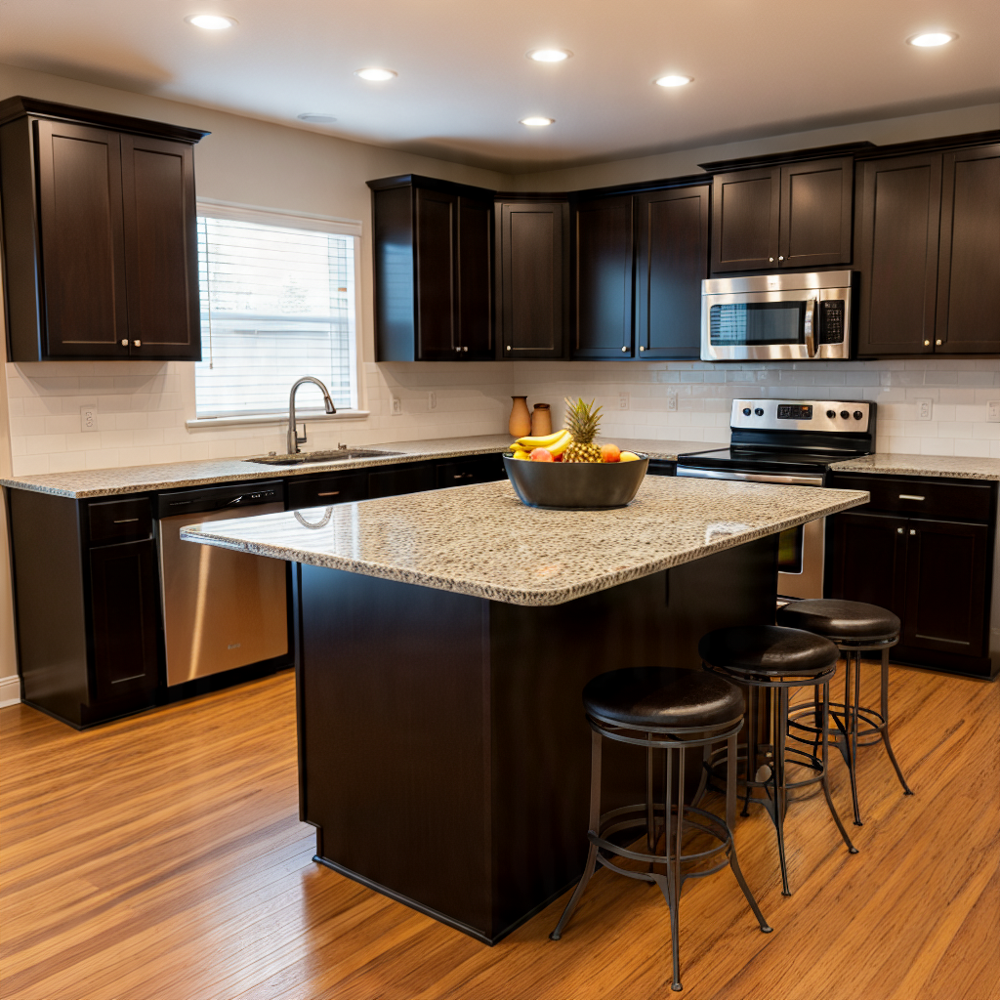

In [14]:
INPUT_IMAGE_PATH = "img/1-kitchen-granite-island-empty.png"
TEXT_INPUT = "You are given realestate listing image of an empty kitchen. Add bar stools to island, fruit bowl and some ceremic containers to kitchen for virual staging"

try:
    start = timeit.default_timer()
    response = analyze_image(INPUT_IMAGE_PATH, TEXT_INPUT)
    elapsed = timeit.default_timer() - start

    print(f"Request took {elapsed:.2f} seconds")

    process_response(response)

except ClientError as err:
    print("Error occurred:")
    print(err)
    if hasattr(err, "response"):
        print(json.dumps(err.response, indent=2))

## 2-Remove Objects from an image - Property Cleanup
In this example we show how to remove objects from an image. We remove cars and garbage from driveway of a home front elevation image.

Request took 13.14 seconds
== Text Output ==

== Image Output ==


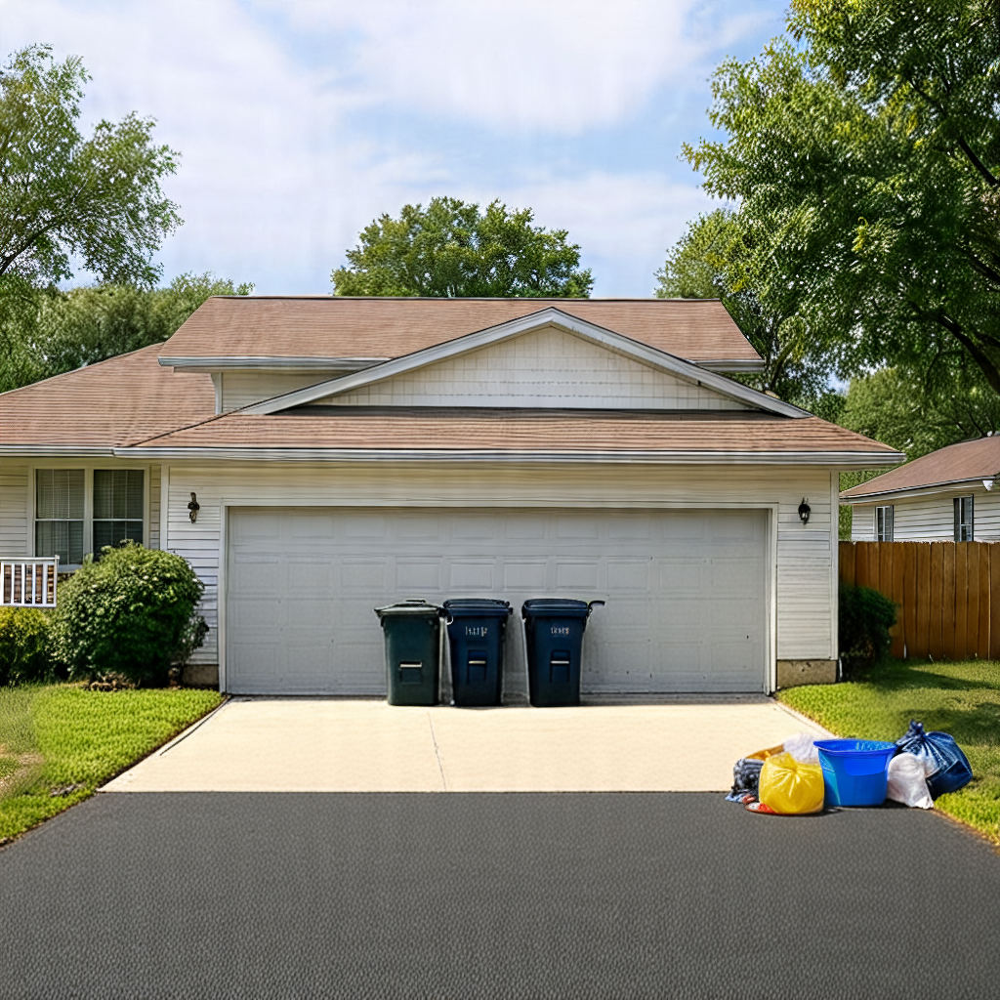

In [15]:
INPUT_IMAGE_PATH = "img/2-home-with-cars-garbage-trashcans.png"
TEXT_INPUT = "Remove cars, garbage and trash cans from image for realestate listing and generate image with empty driveway."

try:
    start = timeit.default_timer()
    response = analyze_image(INPUT_IMAGE_PATH, TEXT_INPUT)
    elapsed = timeit.default_timer() - start

    print(f"Request took {elapsed:.2f} seconds")

    process_response(response)

except ClientError as err:
    print("Error occurred:")
    print(err)
    if hasattr(err, "response"):
        print(json.dumps(err.response, indent=2))

## 2a-Remove Objects from an image and match colors and shades - Property Cleanup
Notice that when it removed cars (and garbage from the image in the prior step), some of the colors and shares were not properly matched to their surroundings. We will improve the prompt with the clear and specific instructions so that the model can match the colors and shades properly. 

Request took 13.13 seconds
== Text Output ==

== Image Output ==


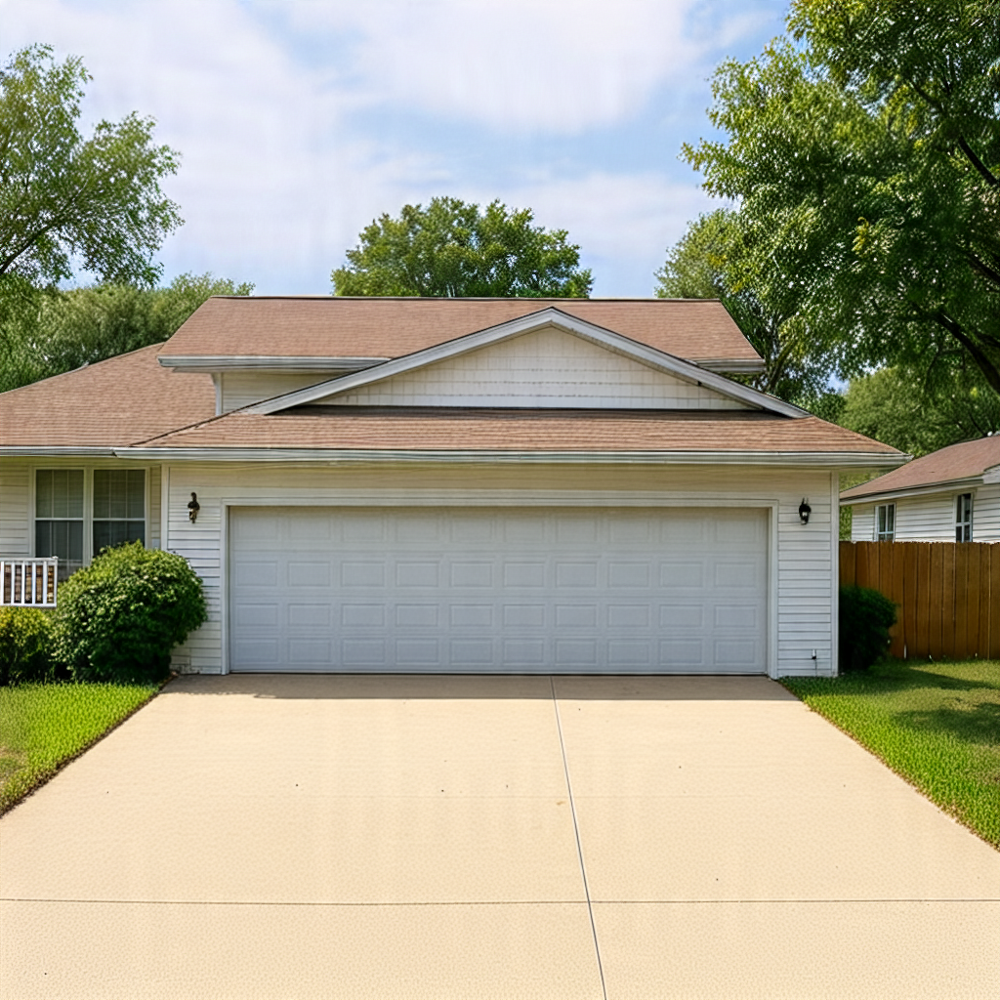

In [18]:
INPUT_IMAGE_PATH = "img/2-home-with-cars-garbage-trashcans.png"
TEXT_INPUT = "Remove cars, remove garbage and remove trash cans from image for realestate listing and generate image with empty driveway." \
" Match the colors properly after removing cars from driveway  and preserve other details of the home exactly as before"

try:
    start = timeit.default_timer()
    response = analyze_image(INPUT_IMAGE_PATH, TEXT_INPUT)
    elapsed = timeit.default_timer() - start

    print(f"Request took {elapsed:.2f} seconds")

    process_response(response)

except ClientError as err:
    print("Error occurred:")
    print(err)
    if hasattr(err, "response"):
        print(json.dumps(err.response, indent=2))

## 3-Replace Objects from an image and match colors & shades to its surrounds properly - Virtual staging.
We will replace old furniture from living room and place new furniture

Request took 13.28 seconds
== Text Output ==

== Image Output ==


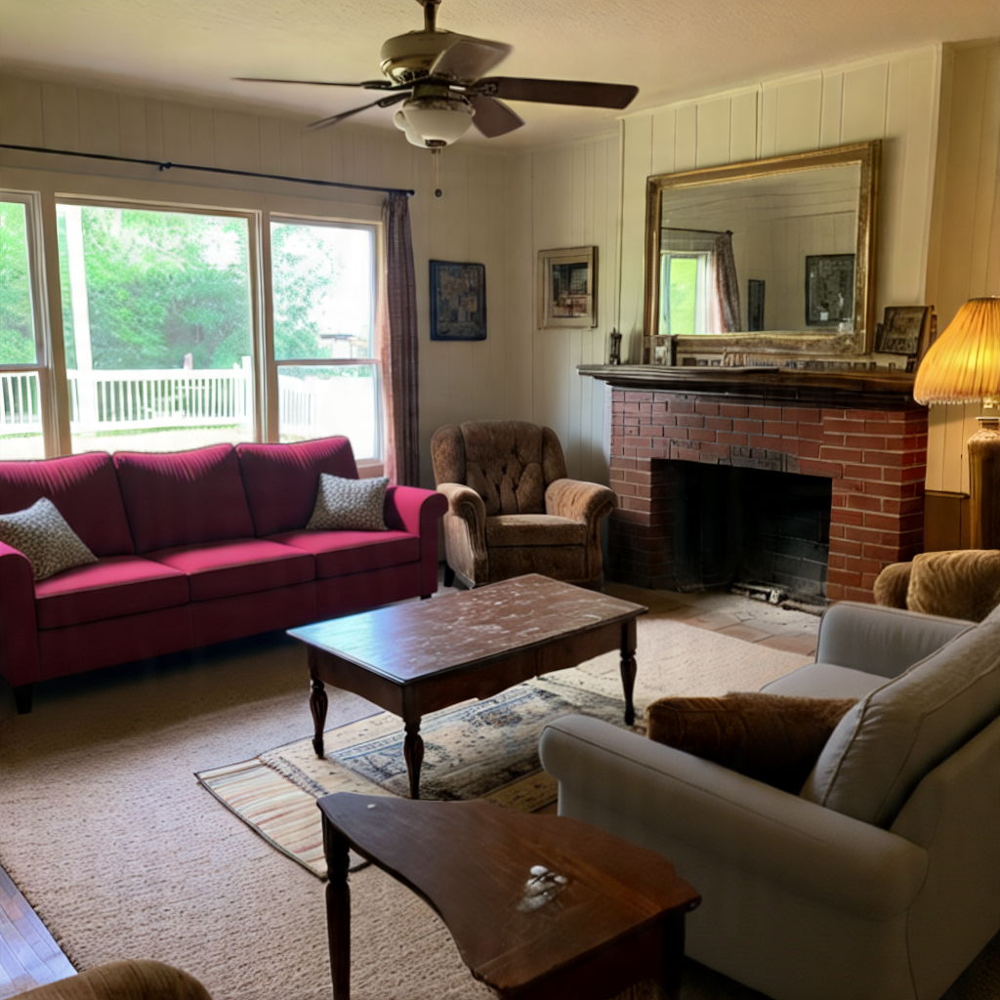

In [19]:
INPUT_IMAGE_PATH = "img/3-living-room-with-old-furniture.png"
TEXT_INPUT = "Replace old furniture from living room and place newer furniture for realestate listing"

try:
    start = timeit.default_timer()
    response = analyze_image(INPUT_IMAGE_PATH, TEXT_INPUT)
    elapsed = timeit.default_timer() - start

    print(f"Request took {elapsed:.2f} seconds")

    process_response(response)

except ClientError as err:
    print("Error occurred:")
    print(err)
    if hasattr(err, "response"):
        print(json.dumps(err.response, indent=2))

Request took 12.79 seconds
== Text Output ==

== Image Output ==


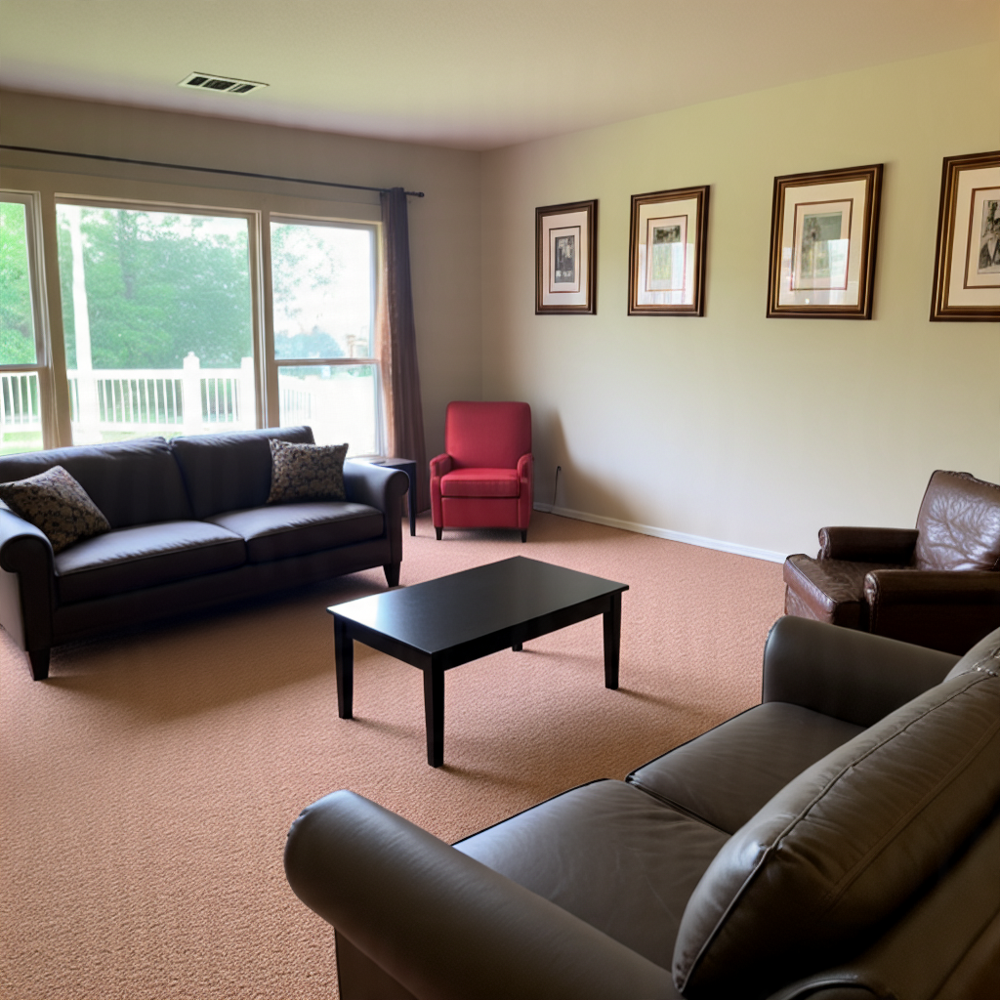

In [20]:
INPUT_IMAGE_PATH = "img/3-living-room-with-old-furniture.png"
TEXT_INPUT = "Replace all old furniture, carpets, picure frames from living room and place newer furniture, newer carpet and picture frames for realestate listing"

try:
    start = timeit.default_timer()
    response = analyze_image(INPUT_IMAGE_PATH, TEXT_INPUT)
    elapsed = timeit.default_timer() - start

    print(f"Request took {elapsed:.2f} seconds")

    process_response(response)

except ClientError as err:
    print("Error occurred:")
    print(err)
    if hasattr(err, "response"):
        print(json.dumps(err.response, indent=2))

Request took 12.72 seconds
== Text Output ==

== Image Output ==


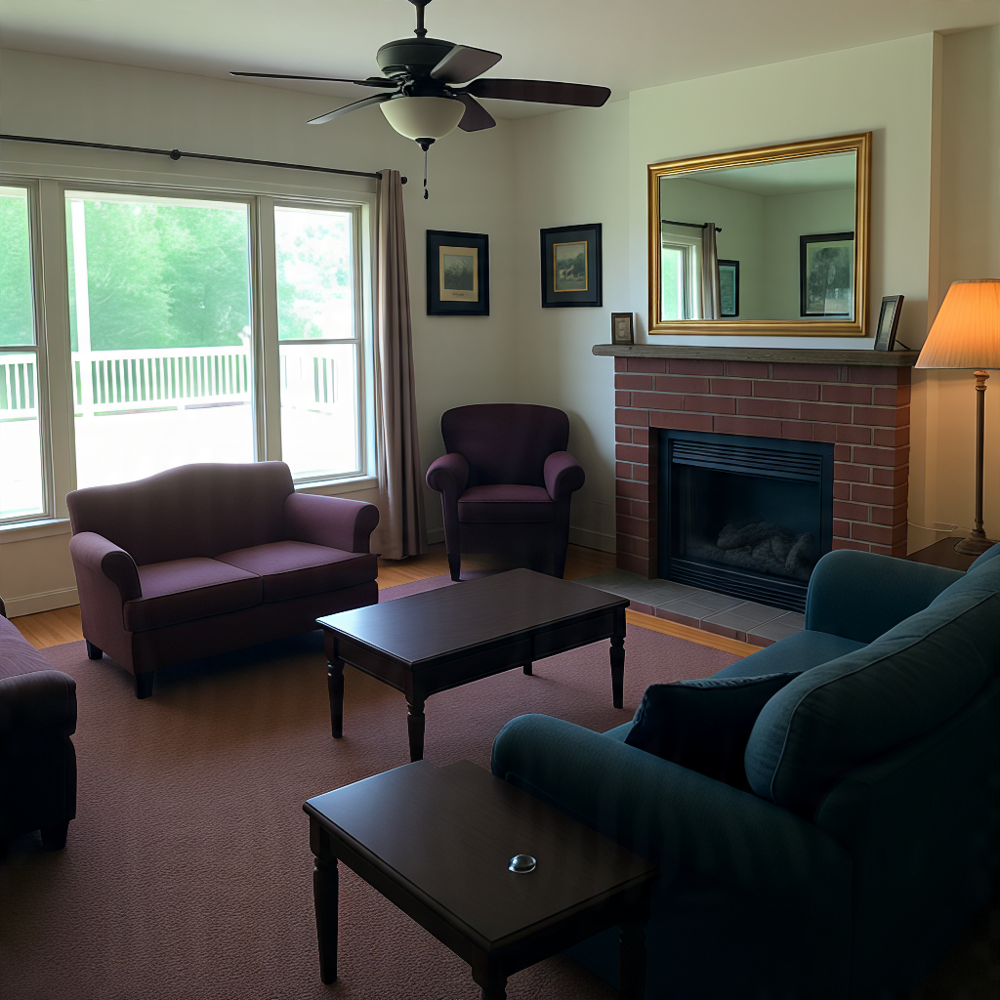

In [23]:
INPUT_IMAGE_PATH = "img/3-living-room-with-old-furniture.png"
TEXT_INPUT = "Replace all old furniture, carpets, picure frames from living room and place newer furniture, newer carpet and picture frames " \
"for realestate listing. Do NOT change the room structure, walls, fire place shape etc. Preserve the current details."

try:
    start = timeit.default_timer()
    response = analyze_image(INPUT_IMAGE_PATH, TEXT_INPUT)
    elapsed = timeit.default_timer() - start

    print(f"Request took {elapsed:.2f} seconds")

    process_response(response)

except ClientError as err:
    print("Error occurred:")
    print(err)
    if hasattr(err, "response"):
        print(json.dumps(err.response, indent=2))

## 4-Background Modificaiton - Sky replacement (adding blue skies). 
Replaces dull or overcast skies with bright blue ones to make the exterior look more inviting. Note that just asking the model to "Preserve all the other details as it is" makes difference. 

Request took 12.64 seconds
== Text Output ==

== Image Output ==


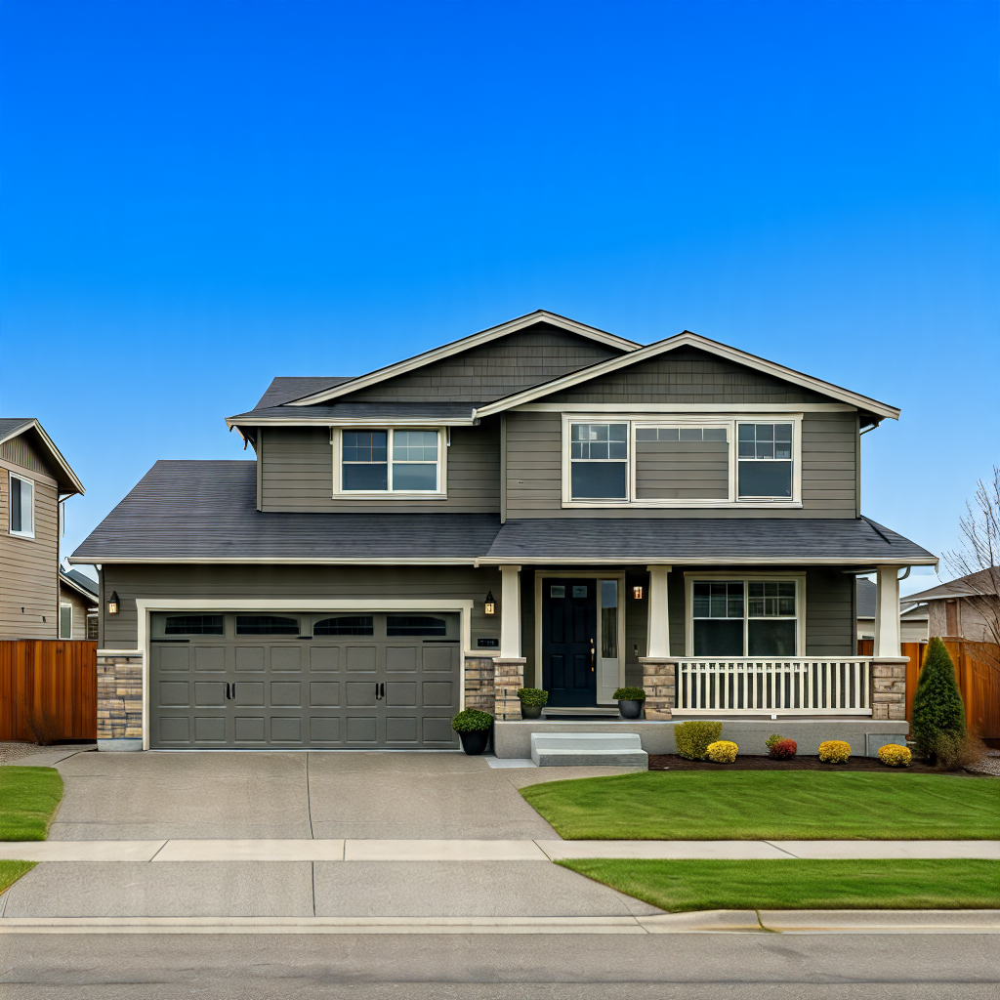

In [25]:
INPUT_IMAGE_PATH = "img/4-front-elevation-cloudy-dark-sky.png"
TEXT_INPUT = "Change the dark cloudy sky to clear blue sky in the image and improve brightness of the image. Preserve all other details as it is"

try:
    start = timeit.default_timer()
    response = analyze_image(INPUT_IMAGE_PATH, TEXT_INPUT)
    elapsed = timeit.default_timer() - start

    print(f"Request took {elapsed:.2f} seconds")

    process_response(response)

except ClientError as err:
    print("Error occurred:")
    print(err)
    if hasattr(err, "response"):
        print(json.dumps(err.response, indent=2))

## 5--Green grass enhancement


Request took 13.91 seconds
== Text Output ==

== Image Output ==


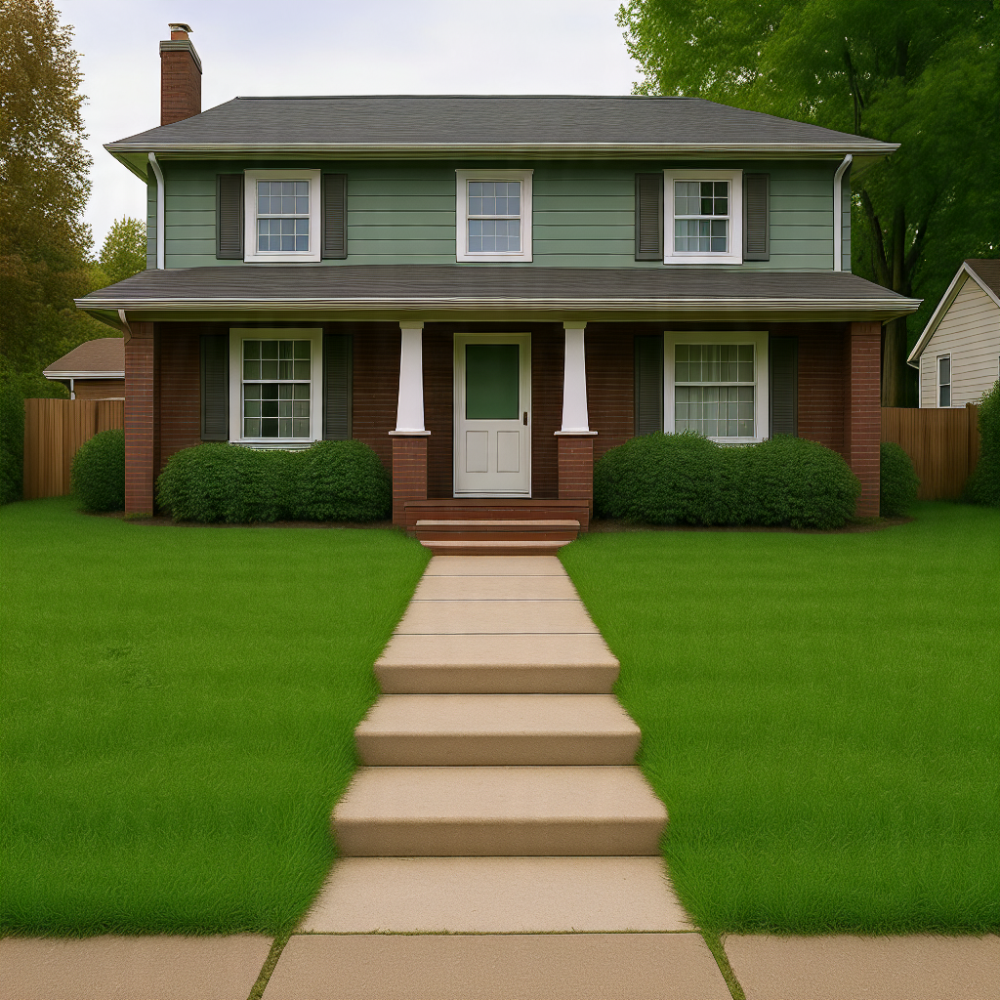

In [ ]:
INPUT_IMAGE_PATH = "img/5-unkept-lawn.png"
TEXT_INPUT = "Improve the lawn in the image for realestate listing. Pay attention to walk way and steps, do not change their shape, just fix grass around them. " \
"Preserve other detail as it is."

try:
    start = timeit.default_timer()
    response = analyze_image(INPUT_IMAGE_PATH, TEXT_INPUT)
    elapsed = timeit.default_timer() - start

    print(f"Request took {elapsed:.2f} seconds")

    process_response(response)

except ClientError as err:
    print("Error occurred:")
    print(err)
    if hasattr(err, "response"):
        print(json.dumps(err.response, indent=2))

Congratulations on finishing the image editing lab! Feel free to try variation of the prompts in the notebook above and see how Nova Omni handles the image editing. The clearer and specific our prompts the better the editing quality of the images. 